In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer

from lightgbm import LGBMRegressor

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['SimSun', 'Times New Roman']
plt.rcParams['axes.unicode_minus'] = False

# 1 数据检视

## 1.1 导入数据

In [2]:
df = pd.read_csv('data/zhengqi_train.txt', sep='\t')
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train.head()

,V0,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V29,V30,V31,V32,V33,V34,V35,V36,V37,target
1427,0.475,0.400,1.097,-0.703,-0.235,-0.427,0.773,0.938,0.864,-0.390,...,-0.580,0.468,0.561,0.554,-0.040,0.160,1.671,-0.258,-1.271,0.328
965,0.780,0.771,1.059,1.406,0.766,-0.666,-0.014,0.174,1.110,-1.252,...,0.913,0.666,0.923,-0.343,2.369,3.099,1.671,0.741,0.358,1.102
1234,0.554,0.293,0.089,-0.106,0.511,-0.232,-0.871,-0.476,0.021,-1.252,...,1.165,0.619,-0.115,-0.536,0.534,-0.290,0.364,-1.183,-0.208,-0.023
662,0.896,0.767,0.804,1.396,1.202,-0.797,0.858,0.678,1.115,0.473,...,-0.365,-0.164,0.691,-0.531,0.362,-0.102,0.483,0.139,-0.224,1.131
2409,0.192,-0.129,1.289,-0.758,-0.804,-1.052,1.033,0.903,0.606,0.042,...,-1.208,0.029,0.003,0.698,0.419,-0.234,-0.893,0.421,-1.947,0.193


## 1.2 因变量分布

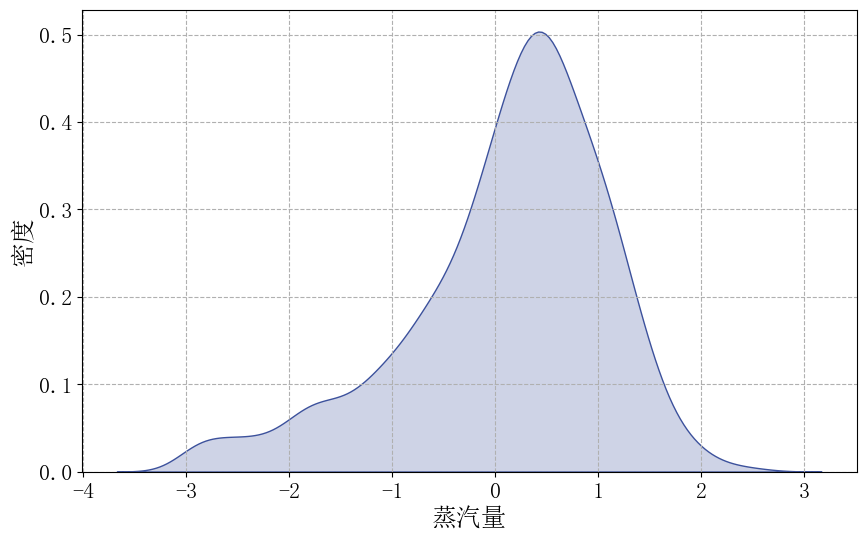

In [3]:
# 设置图形大小
plt.figure(figsize=(10, 6))

sns.kdeplot(df_train['target'], fill=True, color='#3C519C')

plt.xlabel('蒸汽量', fontsize=18)
plt.ylabel('密度', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# 显示网格
plt.grid(True, linestyle='--')
plt.show()

## 1.3 数据总体情况

### 1.3.1 变量统计特征

In [4]:
df_train.describe()

,V0,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V29,V30,V31,V32,V33,V34,V35,V36,V37,target
count,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,...,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000,2310.000000
mean,0.110842,0.050972,0.266850,-0.074470,0.011414,-0.556004,0.158303,0.094756,0.160074,-0.174687,...,0.107455,0.047705,0.106547,0.016213,0.003454,0.010739,0.190732,0.011423,-0.118017,0.111429
std,0.920332,0.932837,0.917923,0.984743,0.883623,0.516486,0.934126,0.973330,0.900820,0.950882,...,1.063506,0.905853,0.892477,0.910780,1.025412,1.021791,1.004772,0.979654,1.018311,0.984842
min,-4.198000,-4.777000,-3.217000,-3.956000,-4.211000,-2.182000,-4.576000,-4.959000,-4.692000,-12.891000,...,-2.912000,-4.507000,-5.733000,-4.053000,-4.627000,-4.789000,-5.695000,-2.608000,-3.630000,-3.044000
25%,-0.312500,-0.228750,-0.348250,-0.665000,-0.397750,-0.850750,-0.350750,-0.319750,-0.168750,-0.390000,...,-0.664750,-0.288000,-0.195000,-0.411000,-0.499000,-0.290000,-0.199750,-0.426000,-0.784750,-0.369500
50%,0.351000,0.268000,0.355000,-0.036000,0.111500,-0.465000,0.376000,0.331500,0.353000,0.042000,...,-0.003000,0.057000,0.296000,0.035000,-0.040000,0.160000,0.364000,0.126000,-0.166500,0.294500
75%,0.716500,0.597750,0.908750,0.626750,0.555000,-0.152000,0.828000,0.781000,0.716000,0.042000,...,0.764750,0.484750,0.632000,0.556250,0.419000,0.273000,0.623750,0.632000,0.519750,0.788750
max,2.092000,1.918000,2.828000,2.457000,2.337000,0.489000,1.895000,1.902000,2.245000,1.335000,...,4.580000,2.689000,2.013000,2.395000,5.465000,5.110000,2.324000,5.238000,2.938000,2.538000


### 1.3.2 缺失值

In [5]:
df_train.isnull().sum()

V0        0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
V29       0
V30       0
V31       0
V32       0
V33       0
V34       0
V35       0
V36       0
V37       0
target    0
dtype: int64

### 1.3.3 异常值

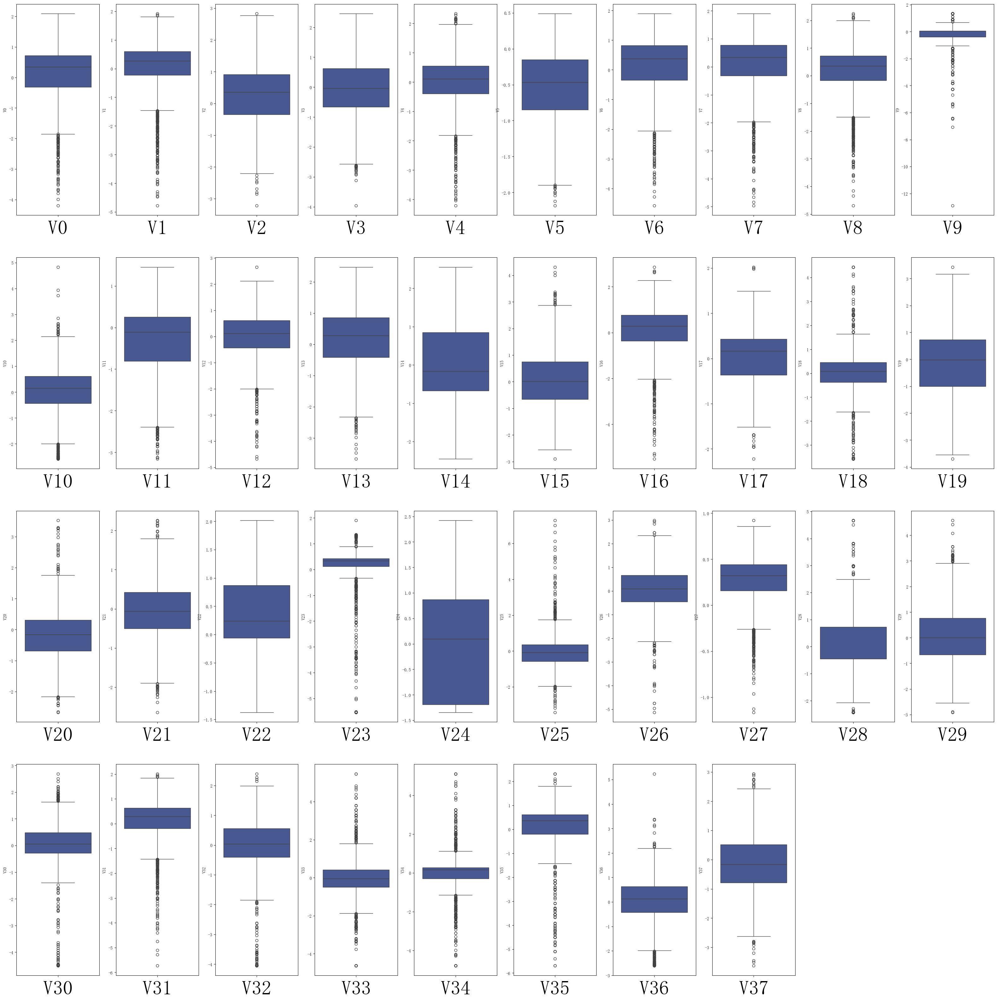

In [6]:
fig, axes = plt.subplots(4, 10, figsize=(40, 40))
axes = axes.flatten()

for i in range(0, 38):
    ax = axes[i]
    sns.boxplot(y=df_train[f'V{i}'], color='#3C519C', ax=ax)
    ax.set_xlabel(f'V{i}', fontsize=45)

for i in range(38, 40):
    axes[i].axis('off')

# plt.tight_layout()
plt.show()

### 1.3.4 重复值

In [7]:
print(f"重复值数量: {df_train.duplicated().sum()}")

重复值数量: 0


## 1.4 变量分布

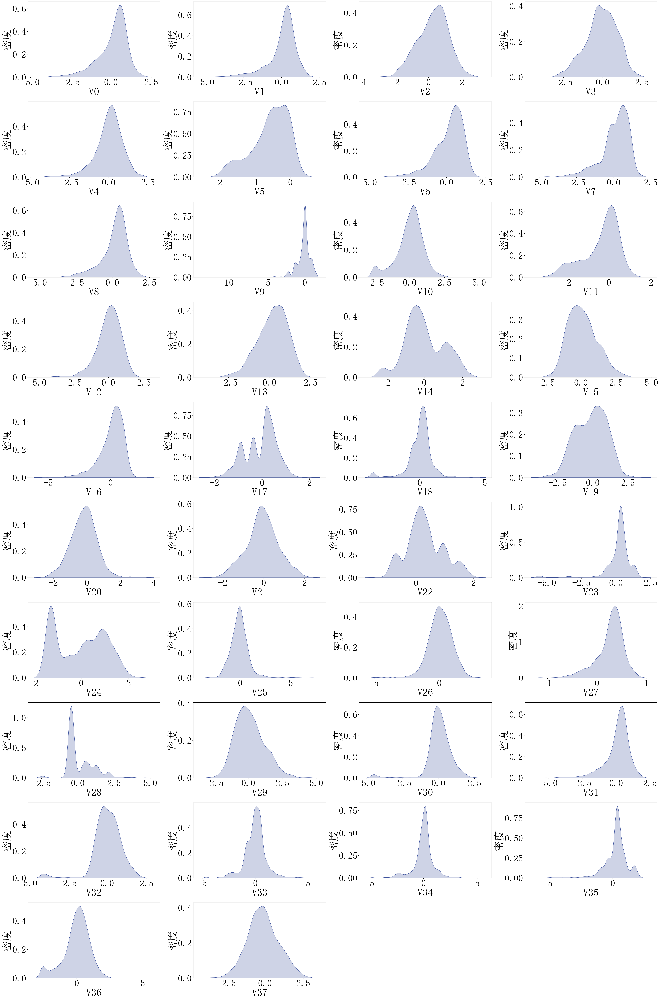

In [8]:
fig, axes = plt.subplots(10, 4, figsize=(40, 60))
axes = axes.flatten()

for i in range(0, 38):
    ax = axes[i]
    sns.kdeplot(df_train[f'V{i}'], fill=True, color='#3C519C', ax=ax)
    ax.set_xlabel(f'V{i}', fontsize=45)
    ax.set_ylabel('密度', fontsize=45)
    ax.tick_params(axis='x', labelsize=40)
    ax.tick_params(axis='y', labelsize=40)

for i in range(38, 40):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## 1.5 相关性分析

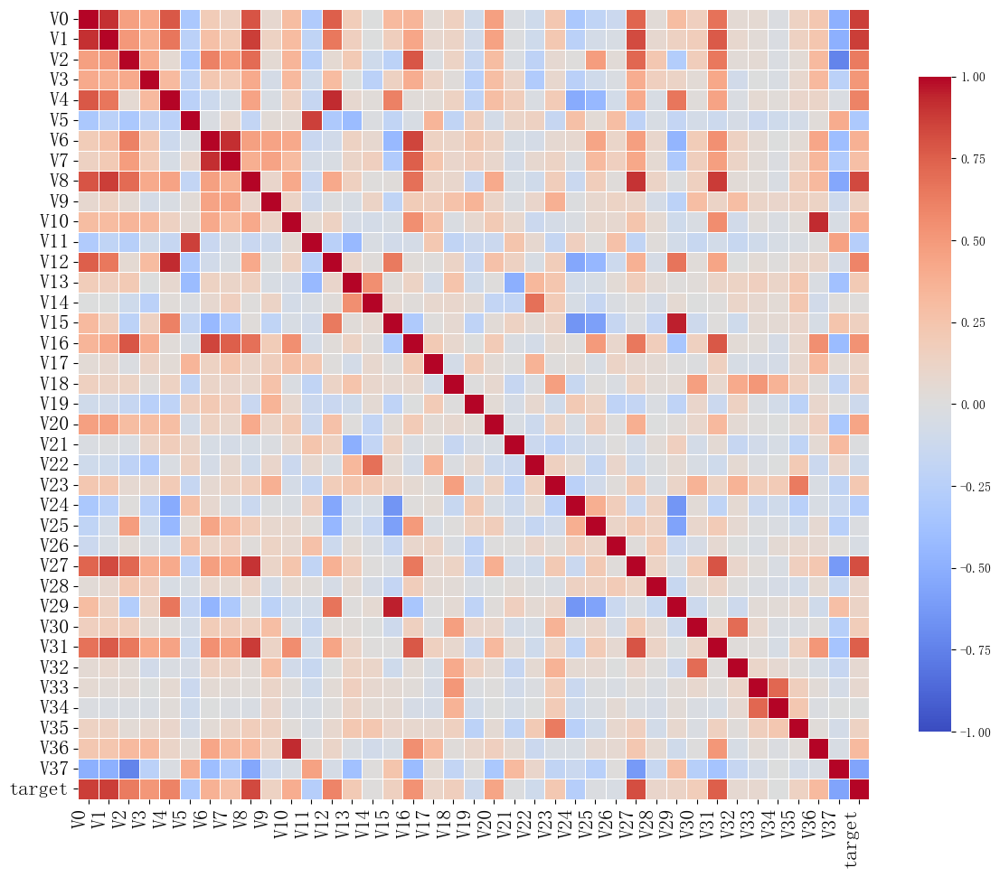

In [9]:
corr = df.corr()

plt.figure(figsize=(12, 10))  # 设置画布大小，根据列数调整
sns.heatmap(
    corr, 
    annot=False,          # 显示数值
    cmap='coolwarm',     # 颜色方案（红正相关、蓝负相关）
    fmt=".2f",           # 数值格式（保留2位小数）
    linewidths=.5,       # 格子间线宽
    linecolor='white',   # 格子边框颜色
    vmin=-1, vmax=1,     # 颜色范围固定在-1到1
    center=0,            # 颜色中心为0
    square=True,         # 正方形格子
    cbar_kws={"shrink": .8}  # 颜色条调整
)
# plt.title('DataFrame 多列相关性热图', fontsize=16)
plt.xticks(rotation=90, ha='right', fontsize=16)  # x轴标签旋转避免重叠
plt.yticks(rotation=0, fontsize=16)
plt.tight_layout()  # 自动调整布局
plt.show()

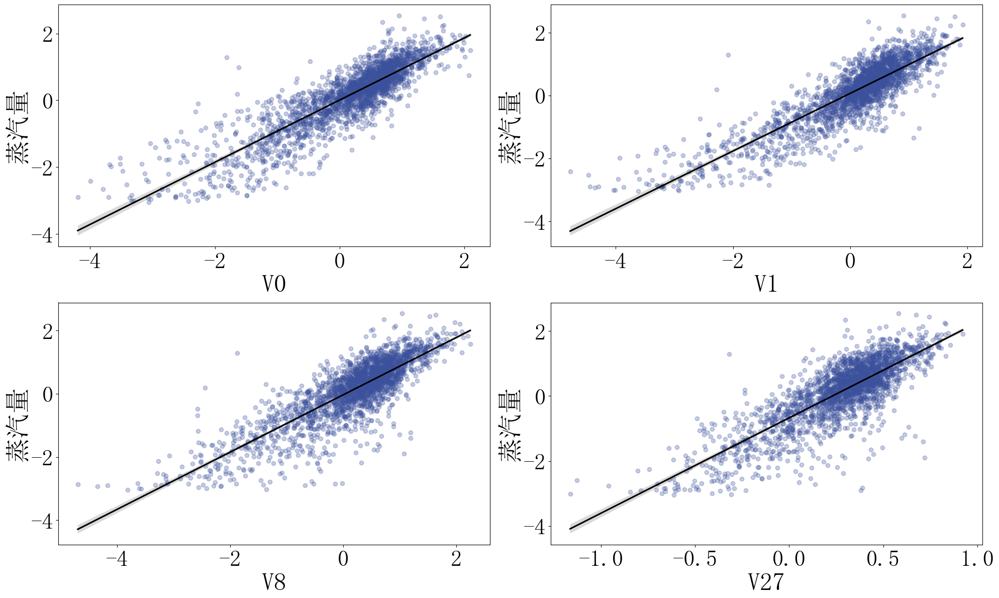

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

for idx, i in enumerate([0, 1, 8, 27]):
    ax = axes[idx]
    sns.regplot(x=df_train[f'V{i}'], y=df_train['target'], color='#3C519C', ax=ax, scatter_kws={'marker':'.','alpha':0.3}, line_kws={'color':'k'})
    ax.set_xlabel(f'V{i}', fontsize=36)
    ax.set_ylabel('蒸汽量', fontsize=36)
    ax.tick_params(axis='x', labelsize=32)
    ax.tick_params(axis='y', labelsize=32)

plt.tight_layout()
plt.show()

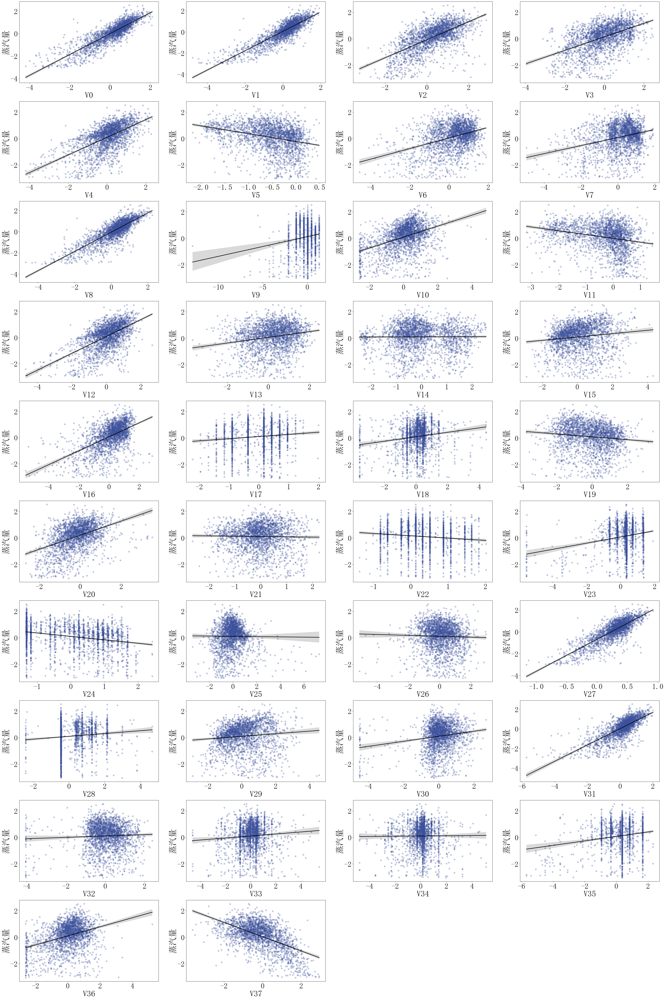

In [11]:
fig, axes = plt.subplots(10, 4, figsize=(40, 60))
axes = axes.flatten()

for i in range(0, 38):
    ax = axes[i]
    sns.regplot(x=df_train[f'V{i}'], y=df_train['target'], color='#3C519C', ax=ax, scatter_kws={'marker':'.','alpha':0.3}, line_kws={'color':'k'})
    ax.set_xlabel(f'V{i}', fontsize=36)
    ax.set_ylabel('蒸汽量', fontsize=36)
    ax.tick_params(axis='x', labelsize=32)
    ax.tick_params(axis='y', labelsize=32)

for i in range(38, 40):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# 2 数据处理

## 2.1 数据分割

In [12]:
train_x = df_train.drop(columns=['target'])
train_y = df_train['target']

test_x = df_test.drop(columns=['target'])
test_y = df_test['target']

## 2.2 标准化

In [13]:
# 对连续变量进行标准化处理
from sklearn.preprocessing import StandardScaler

transformer = StandardScaler().fit(train_x)
train_x = transformer.transform(train_x)
test_x = transformer.transform(test_x)

# 3 建模

## 3.1 参数调优

In [14]:
# ================== 定义参数网格（5个核心参数） ==================
param_grid = {
    'n_estimators': [500, 1000, 1500],      # 树的数量
    'learning_rate': [0.01, 0.05, 0.1],     # 学习率
    'num_leaves': [20, 31, 50],             # 叶子节点数
}

# 创建基础模型（其他参数使用常用默认值）
model = LGBMRegressor(
    max_depth=6,             # 最大深度（注意：LightGBM 默认使用 leaf-wise 生长，max_depth 是辅助限制）
    subsample=0.8,           # 行采样固定为0.8
    colsample_bytree=0.8,    # 列采样固定为0.8
    random_state=42,
    verbosity=-1,
    n_jobs=-1
)

# 创建5折交叉验证
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 定义评分器（负MSE，因为GridSearchCV默认最大化）
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

# 创建网格搜索对象
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring=mse_scorer,
    cv=cv,
    verbose=2,           # 显示进度
    n_jobs=-1            # 使用所有CPU核心
)

# ================== 开始网格搜索 ==================
print("=" * 60)
print("开始网格搜索调参...")
print(f"参数组合总数: {3 * 3 * 3} = 27 组")
print(f"交叉验证折数: 5")
print(f"总训练次数: 27 × 5 = 135 次")
print("=" * 60)

grid_search.fit(train_x, train_y)

# ================== 输出最佳参数 ==================
print("\n" + "=" * 60)
print("网格搜索完成！")
print("=" * 60)
print(f"\n【最佳参数】")
for param, value in grid_search.best_params_.items():
    print(f"  {param:20s}: {value}")

print(f"\n【交叉验证最佳 MSE】: {-grid_search.best_score_:.4f}")

# ================== 在测试集上评估 ==================
print("\n" + "=" * 60)
print("在测试集上评估最佳模型")
print("=" * 60)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(test_x)

# 计算各项指标
mse = mean_squared_error(test_y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y, y_pred)
r2 = r2_score(test_y, y_pred)

print(f'\nMean Squared Error (MSE):       {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE):      {mae:.4f}')
print(f'R² Score:                       {r2:.4f}')

# ================== 显示Top 10特征重要性（可选） ==================
print("\n" + "=" * 60)
print("Top 10 特征重要性")
print("=" * 60)

feature_importance = best_model.feature_importances_
if hasattr(train_x, 'columns'):
    feature_names = train_x.columns
else:
    feature_names = [f'Feature_{i}' for i in range(train_x.shape[1])]

# 排序并显示
importance_ranking = sorted(
    zip(feature_names, feature_importance), 
    key=lambda x: x[1], 
    reverse=True
)

for rank, (name, importance) in enumerate(importance_ranking[:10], 1):
    print(f"{rank:2d}. {name:30s}: {importance:8.4f}")

print("\n调参完成！")

开始网格搜索调参...
参数组合总数: 27 = 27 组
交叉验证折数: 5
总训练次数: 27 × 5 = 135 次
Fitting 5 folds for each of 27 candidates, totalling 135 fits

网格搜索完成！

【最佳参数】
  learning_rate       : 0.05
  n_estimators        : 1500
  num_leaves          : 31

【交叉验证最佳 MSE】: 0.1116

在测试集上评估最佳模型

Mean Squared Error (MSE):       0.0941
Root Mean Squared Error (RMSE): 0.3068
Mean Absolute Error (MAE):      0.2229
R² Score:                       0.9016

Top 10 特征重要性
 1. Feature_3                     : 1206.0000
 2. Feature_10                    : 1179.0000
 3. Feature_36                    : 1160.0000
 4. Feature_20                    : 1048.0000
 5. Feature_32                    : 1020.0000
 6. Feature_2                     : 1013.0000
 7. Feature_27                    : 962.0000
 8. Feature_19                    : 922.0000
 9. Feature_26                    : 914.0000
10. Feature_13                    : 912.0000

调参完成！


d:\miniconda3\envs\ML\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


## 3.2 可视化

### 3.2.1 真实值 vs 预测值散点图

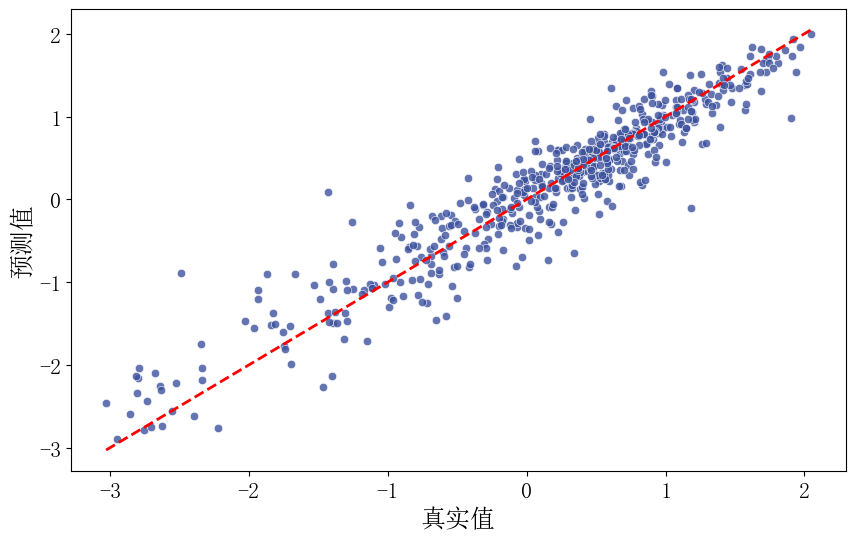

In [15]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x=test_y, y=y_pred, color='#3C519C', markers='o', alpha=0.8)
plt.plot([test_y.min(), test_y.max()], [test_y.min(), test_y.max()], 'r--', lw=2)

plt.xlabel('真实值', fontsize=18)
plt.ylabel('预测值', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.show()

### 3.2.2 残差图

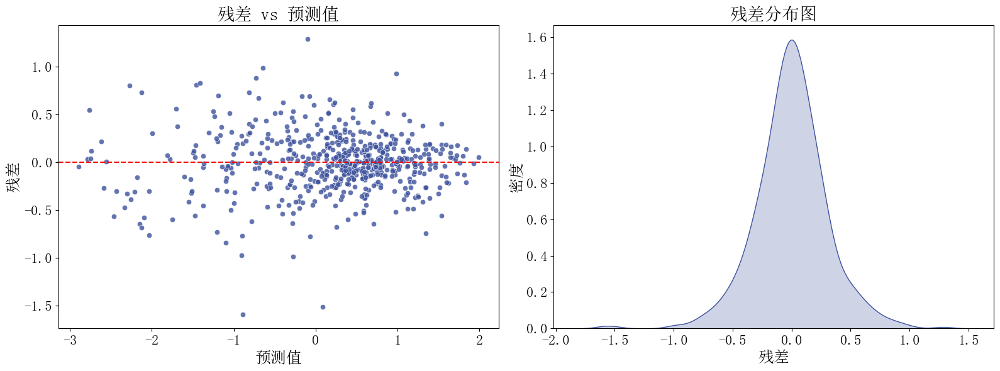

In [16]:
residuals = test_y - y_pred

plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x=y_pred, y=residuals, color='#3C519C', markers='o', alpha=0.8)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('预测值', fontsize=18)
plt.ylabel('残差', fontsize=18)
plt.title('残差 vs 预测值', fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.subplot(1, 2, 2)
sns.kdeplot(residuals, fill=True, color='#3C519C')
plt.xlabel('残差', fontsize=18)
plt.ylabel('密度', fontsize=18)
plt.title('残差分布图', fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()
plt.show()

### 3.2.3 SHAP 摘要图

d:\miniconda3\envs\ML\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


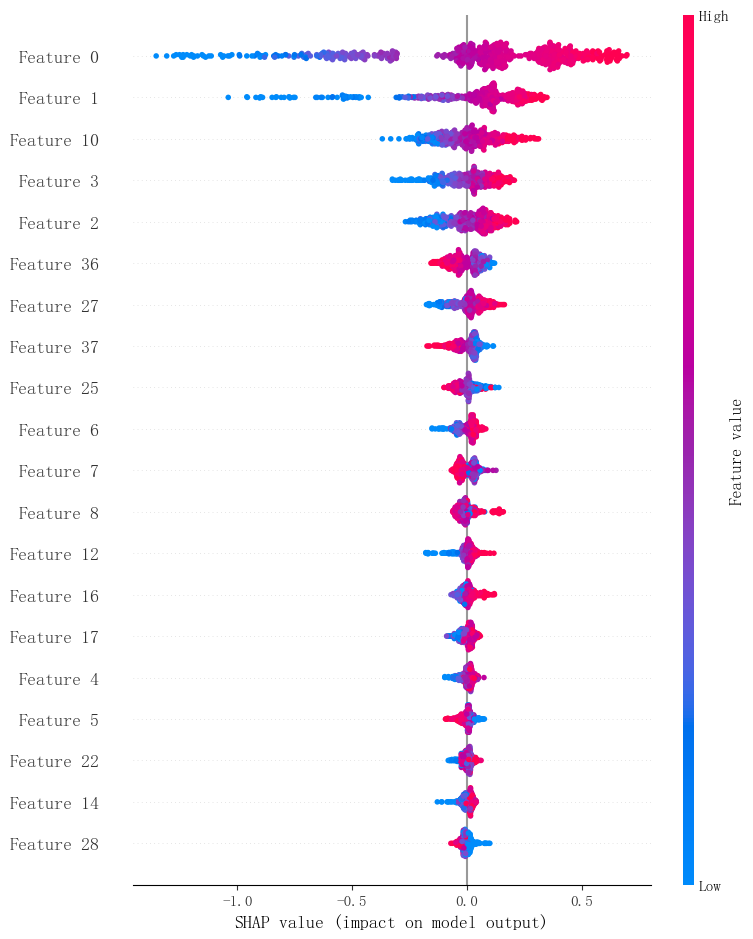

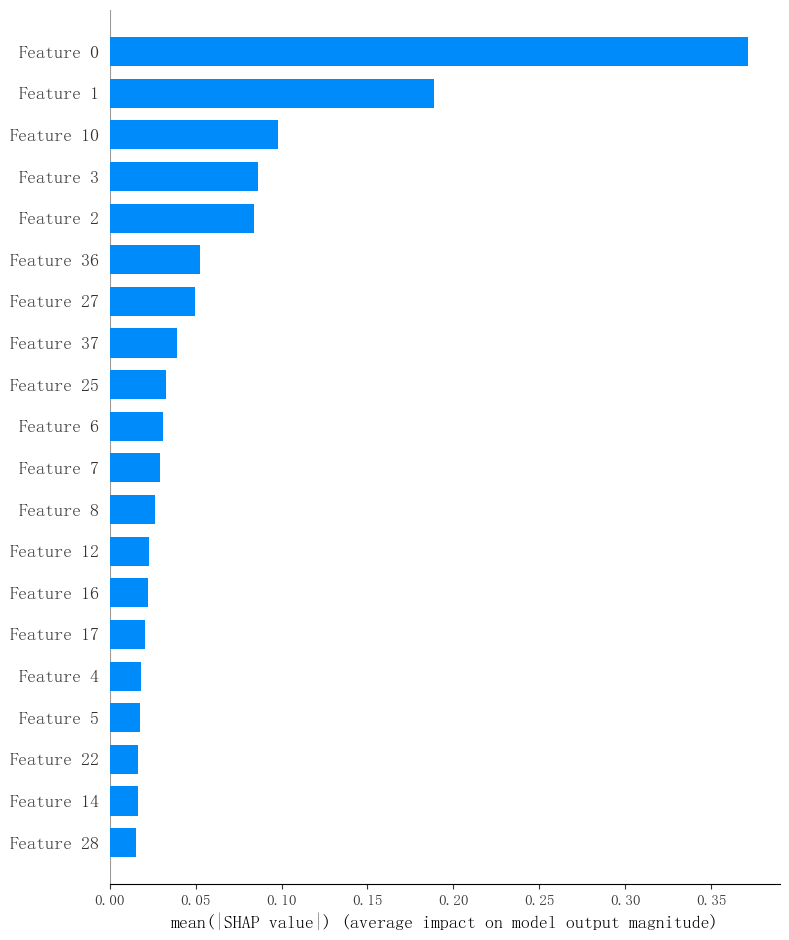

In [17]:
import shap
import matplotlib.pyplot as plt

# 显式使用 TreeExplainer（更快、更稳）
explainer = shap.TreeExplainer(best_model)

# 计算 SHAP 值（注意：TreeExplainer 不需要传 train_x！）
shap_values = explainer.shap_values(test_x)

# 绘图
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, test_x, show=False)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, test_x, plot_type="bar", show=False)
plt.tight_layout()
plt.show()

## 3.3 基线对比

In [18]:
model = SVR()
model.fit(train_x, train_y)

# 训练完成后，预测测试集
y_pred = model.predict(test_x)

# 计算各种评价指标
mse = mean_squared_error(test_y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y, y_pred)
r2 = r2_score(test_y, y_pred)

# 输出结果（保留4位小数）
print(f'Mean Squared Error (MSE):  {mse:.4f}')   # 官方评分指标
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE):  0.1157
Root Mean Squared Error (RMSE): 0.3402
Mean Absolute Error (MAE): 0.2347
R² Score: 0.8791
